# ATSC 528 Homework 2: Successive Corrections  
Author: Brian T. Horan  
Created: 10/17/2022  
Assignment: ATSC 528 HW 2  
Purpose: To read in upper air observations and plot them on a polar stereographic projection using successive corrections. The data is read in using pandas. The grid is created with np.meshgrid, and the Lats/Lons from the observations are converted to x and y coordinates, in CM, to analyze using relative radius of influence. The dmin is calculated using the relative radius and found with numpy functions. The Cressman weight function is implemented in a function which calculates each obs weight for the roi.  
# FINISH THIS

In [1]:
### Import Required Modules (shouldn't need to change) ###
import numpy as np                 #numpy for math
import matplotlib.pyplot as plt    #matplotlib for plotting
import cartopy.crs as ccrs         #cartopy for plotting on map
import cartopy.feature as cfeature #cartopy basic shapefiles
import pandas as pd                #Pandas for opening file

In [2]:
#Set some global variables for use
global x_o
global y_o
global del_x
global del_y

In [3]:
#Define a function to find the dmin
def calc_dmin(x_obs, y_obs):
    min_rois = np.empty((len(x_obs)))
    for i in range(len(x_obs)):
        rel_x = x_obs[i] - x_obs
        rel_y = y_obs[i] - y_obs
        rel_rad = (rel_x **2 + rel_y **2)**0.5
        rel_rad = np.delete(rel_rad, i)
        min_rois[i] = np.amin(rel_rad)
    return np.mean(min_rois)

In [106]:
### Create function for Cressman Analysis ###
#Function only finds the analysis point one at a time
def cressman(roi, xs, ys, fo, anal_back=None, back_o = None):
    
    #Variables passed in
    #roi = The ROI
    #xs = x points of observations in roi
    #ys = y points of observations in roi
    #fo = Observations
    #anal_back = analysis background
    #back_o = observation background
    wgts = np.empty((len(xs)))
    for i in range(len(xs)):
        rad1 = (xs[i]**2 + ys[i]**2) **0.5
        wgt = (roi**2 - rad1**2)/(roi**2 + rad1**2)
        wgts[i] = wgt
    
    if anal_back == None:
        cressanal = np.nansum(wgts*fo)/np.sum(wgts) 
        return cressanal
    
    else:
        cressanal = anal_back + (np.nansum(wgts*(fo-back_o))/np.sum(wgts))
        return cressanal

In [107]:

### Create function for bilinear interpolation ###
def bilinear_interp(xob, yob, a, n_roi):
    
    #Variables passed in
    # A = Analysis observations
    # x_ob = location of x for ob
    # y_ob = location of y for ob
    #n_roi = number of roi
    
    xind = (xob - x_o) / del_x
    yind = (yob - y_o) / del_y    
    sq_mat = np.matrix([[1, -1, -1, 1],[0, 0, 1, -1],[0, 1, 0, -1],[0, 0, 0, 1]])
    di = xind - np.floor(xind)
    dj = yind - np.floor(yind)
    xind = int(np.floor(xind))
    yind = int(np.floor(yind))
    a_mat = np.matrix([1, di, dj, di*dj]).T
    fmat = np.matrix([a[yind, xind, n_roi],
            a[yind,xind+1,n_roi],
            a[yind+1, xind,n_roi],
             a[yind+1, xind+1,n_roi]])
    
    
    
    return fmat * sq_mat * a_mat

In [120]:
#define a method to find the background obs using either Bilinear interpolation, Cressman analysis, or setting it to NaN if not in the ROI
def find_background_obs(roi, n_roi):
    #Variables passed in
    #roi = radius of influence
    #n_roi = number of the roi/iteration number
    
    print(roi)
    for i in range(len(hgts_500)):
        if x_observed[i] > np.amin(xs) and \
            x_observed[i] < np.amax(xs) and \
            y_observed[i] > np.amin(ys) and \
            y_observed[i] < np.amax(ys):
                #print('In radius ' + str(i))
                background_obs[i, n_roi-1] = bilinear_interp(x_observed[i], y_observed[i], analysis_arr, n_roi-1)
        else: 
            rad = ((x_observed[i]-xs)**2 + (y_observed[i]-ys)**2)**0.5
            if np.min(rad) > roi:
                background_obs[i, n_roi-1] = np.nan
            
            else:
                inds_roia = np.where(rad <= roi)
                rel_xb = (x_observed[i] - xs[inds_roia]).flatten()
                rel_yb = (y_observed[i] - ys[inds_roia]).flatten()
                heights = (analysis_arr[:,:,n_roi-1][inds_roia]).flatten()
                print(len(rel_xb))
                background_obs[i, n_roi-1] = cressman(roi, rel_xb, rel_yb, heights)

In [121]:
### Read in observations ###
ds = pd.read_csv('./RAOBs_201903131200.txt', names = ['Station', 'Lat', 'Lon', 'Height', 'Wind_dir', 'Wind_spd'])
lons = ds['Lon']
lats = ds['Lat']
hgts_500 = ds['Height']

In [122]:
### Set up analysis map with a 22x28 rectangular grid of points ###
#The analysis grid is the same as the one for homework 1, so I will recycle this code here.
x_o = 18.90
y_o = -6.3
del_x = 1.27
del_y = 1.27
x_n = 22
y_n = 28


x_grid = np.arange(start = x_o, stop = (x_o+x_n*del_x) - 1, step=del_x)
y_grid = np.arange(start = y_o, stop = (y_o+y_n*del_y) - 1, step=del_y)
xs, ys = np.meshgrid(x_grid, y_grid)

In [123]:
### convert obs lat/long to x,y ###
rho = 6371 * 1e5
psi_0 = 60 * (np.pi/180)
map_proj = 1/(15e6)
lambda_not = -115

LATS_grid = (180/np.pi) * ((np.pi/2) - (2*np.arctan((np.sqrt((xs/map_proj)**2 + (ys/map_proj)**2))/(rho*(1+np.sin(psi_0)))))) 
LONS_grid = np.arctan(ys/xs) * (180/np.pi) + lambda_not

In [124]:
sigma = (1+np.sin(psi_0))/(1+np.sin((lats*(np.pi/180))))
r = rho * sigma * np.cos(lats*((np.pi/180))) * map_proj
y_observed = r*np.sin((lons*(np.pi/180))-lambda_not * (np.pi/180))
x_observed = r*np.cos(((lons*(np.pi/180)) - (lambda_not*(np.pi/180))))

In [125]:
#Use radii of influence 4, 2.5, 1.5 *dmin
dmin = calc_dmin(x_observed.values, y_observed.values)
rois = np.array([4, 2.5, 1.5]) * dmin
print(rois)

[10.21948033  6.38717521  3.83230512]


In [126]:
#declare empty arrays for storage of values
analysis_arr = np.empty((y_n, x_n, len(rois)))
n_obs_arr = np.empty((y_n, x_n, len(rois)))
background_obs = np.empty((len(hgts_500), len(rois)))


In [127]:
### First analysis, no successive corrections ###
for i in range(len(xs)):
    for j in range(len(xs[0])):
        rel_x = xs[i, j] - x_observed
        rel_y = ys[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[0])[0]
        n_obs_arr[i, j, 0] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
            
        analysis_arr[i, j, 0] = cressman(rois[0], x_k, y_k, fo)

In [128]:
### Calculate background 1 and successive correction pass 1
find_background_obs(rois[0], 1)
for i in range(len(xs)):
    for j in range(len(xs[0])):
        rel_x = xs[i, j] - x_observed
        rel_y = ys[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[1])[0]
        n_obs_arr[i, j, 1] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
        
        back_a = analysis_arr[i,j,0]
        back_o = background_obs[ind_rois, 0]
        analysis_arr[i, j, 1] = cressman(rois[1], x_k, y_k, fo, anal_back = back_a, back_o = back_o)

10.21948032802857
88
53
36
35
59
98
9
30
68
62
60
99
10
4
17
83
1
88
2
108
19
14
83
85
37
106
78
1
40
43
60


In [129]:
#calculate background pass 2 and correction pass 2
find_background_obs(rois[1], 2)
print(background_obs[:,1])
for i in range(len(xs)):
    for j in range(len(xs[0])):
        rel_x = xs[i, j] - x_observed
        rel_y = ys[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[2])[0]
        n_obs_arr[i, j, 2] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
        
        back_a = analysis_arr[i,j,1]
        back_o = background_obs[ind_rois, 1]
        analysis_arr[i, j, 2] = cressman(rois[2], x_k, y_k, fo, anal_back = back_a, back_o = back_o)

6.387175205017856
31
12
9
2
24
37
20
25
17
43
1
38
31
43
3
37
40
3
44
37
5
15
24
[5447.55696486 5524.96259355 5350.02527577 5273.09981954 5203.19337209
 5186.97143214           nan 5270.8039722  5143.54711669 5436.14763285
           nan 5451.29259768 5239.56233866 5377.94054592           nan
 5466.96237552 5244.47118783           nan 5249.79942249 5271.66689732
 5325.16029724 5231.89736293 5359.88822058 5435.17093147 5428.09643198
 5393.62412417 5473.58706124 5538.15220428           nan 5711.3576906
           nan 5463.28634036 5647.61143123 5535.6575506  5280.21873654
 5375.93494037 5633.7220107  5774.66442479           nan 5495.95840691
 5817.35499599 5778.07747899 5418.31862351 5786.1417506            nan
 5670.48504515 5766.51978698 5505.07820816           nan 5632.46657054
 5816.53528488 5758.06831115 5535.99561934 5477.50183231 5686.76882106
 5531.0138795  5479.50105714 5683.8450295  5675.74158743 5665.04624996
 5533.90148104 5898.49009375 5282.30972719 5818.95430856 5503.999224

/tmp/ipykernel_5774/2212357984.py:23: RuntimeWarning: invalid value encountered in double_scalars
  cressanal = anal_back + (np.nansum(wgts*(fo-back_o))/np.sum(wgts))


In [130]:
#Calculate differences in analysis fields
diff_21 = analysis_arr[:,:,1] - analysis_arr[:,:,0]
diff_31 = analysis_arr[:,:,2] - analysis_arr[:,:,0]
diff_32 = analysis_arr[:,:,2] - analysis_arr[:,:,1]

In [131]:
#calculate background 3 and RMS values
find_background_obs(rois[2], 3)

rms_sum1 = (hgts_500 - background_obs[:,0])**2
rms_sum1 = rms_sum1[~np.isnan(rms_sum1)]
rms_sum2 = (hgts_500 - background_obs[:,1])**2
rms_sum2 = rms_sum2[~np.isnan(rms_sum2)]
rms_sum3 = (hgts_500 - background_obs[:,2])**2
rms_sum3 = rms_sum3[~np.isnan(rms_sum3)]

rms1 = np.sqrt((np.sum(rms_sum1))/len(rms_sum1))
print(rms1)
rms2 = np.sqrt((np.sum(rms_sum2))/len(rms_sum2))
print(rms2)
rms3 = np.sqrt(np.sum(rms_sum3)/len(rms_sum3))
print(rms3)

3.832305123010714
10
7
12
3
8
2
17
13
9
16
14
15
16
16
3
9
74.54329800402633
35.127661265817096
14.860428194570522


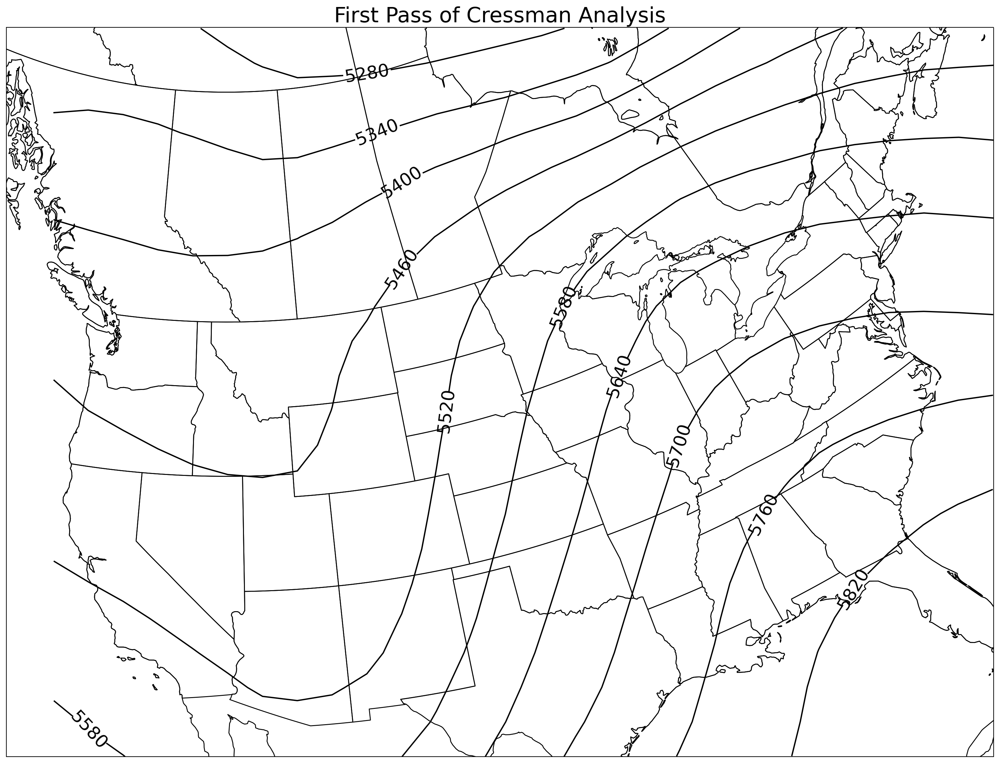

In [132]:
### Plot 500mb analyses over a map ###
#use old code...
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,0], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('First Pass of Cressman Analysis')
plt.show()


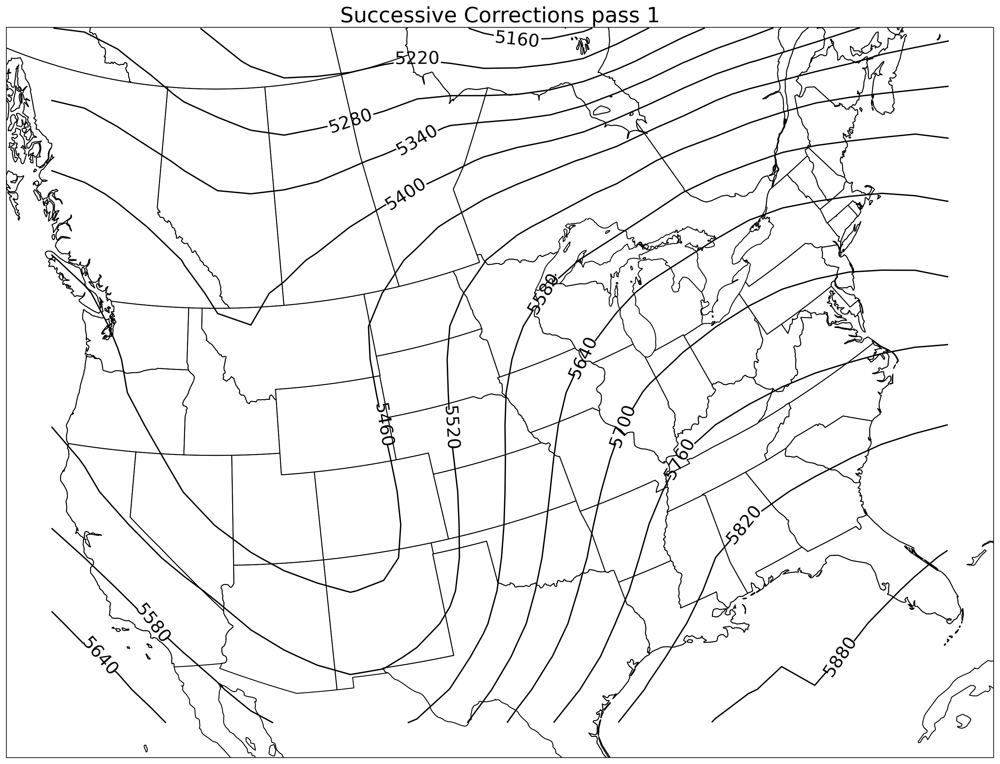

In [133]:
### Plot 500mb analyses over a map ###
#use old code...
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,1], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Successive Corrections pass 1')
plt.show()


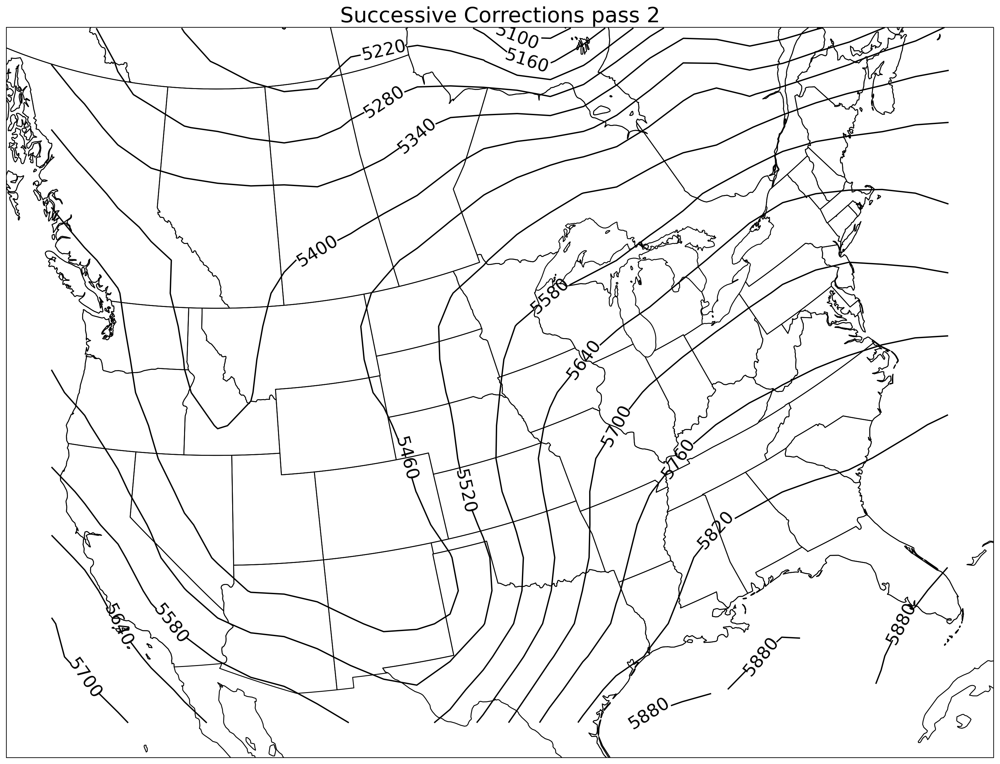

In [134]:
### Plot 500mb analyses over a map ###
#use old code...
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,2], colors = 'k', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Successive Corrections pass 2')
plt.show()

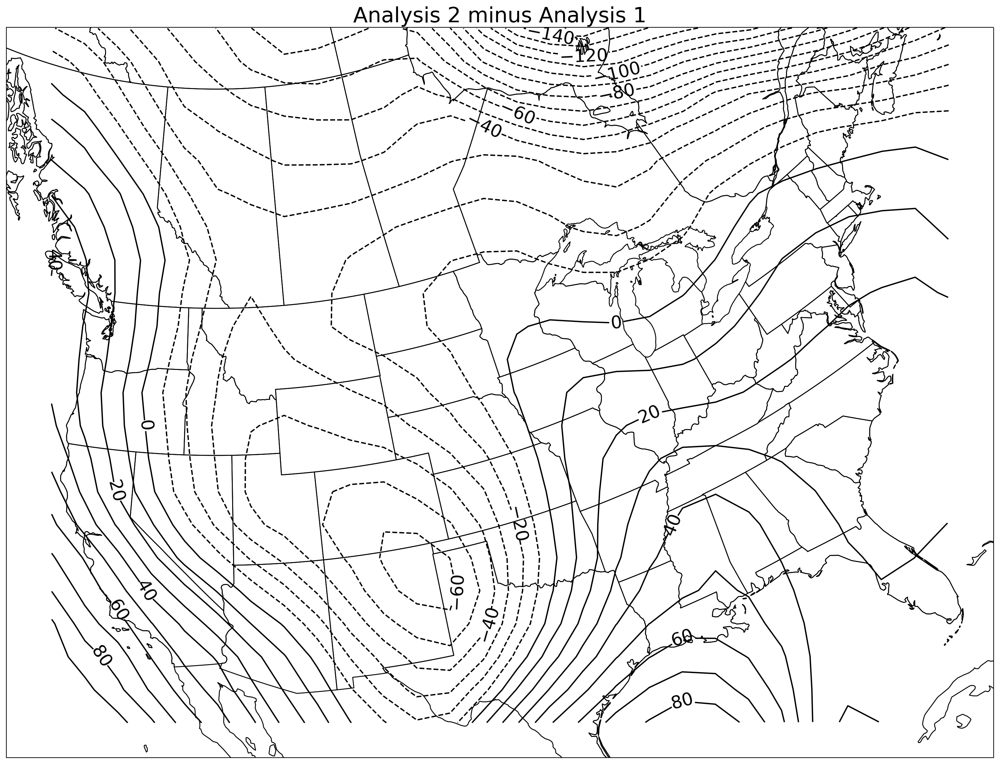

In [135]:
### Plot Analysis Differences ###
fig = plt.figure(figsize = (20,20),dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, diff_21, colors = 'k', levels = np.arange(-160,160,10), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-160,160,20))
plt.title('Analysis 2 minus Analysis 1')
plt.show()

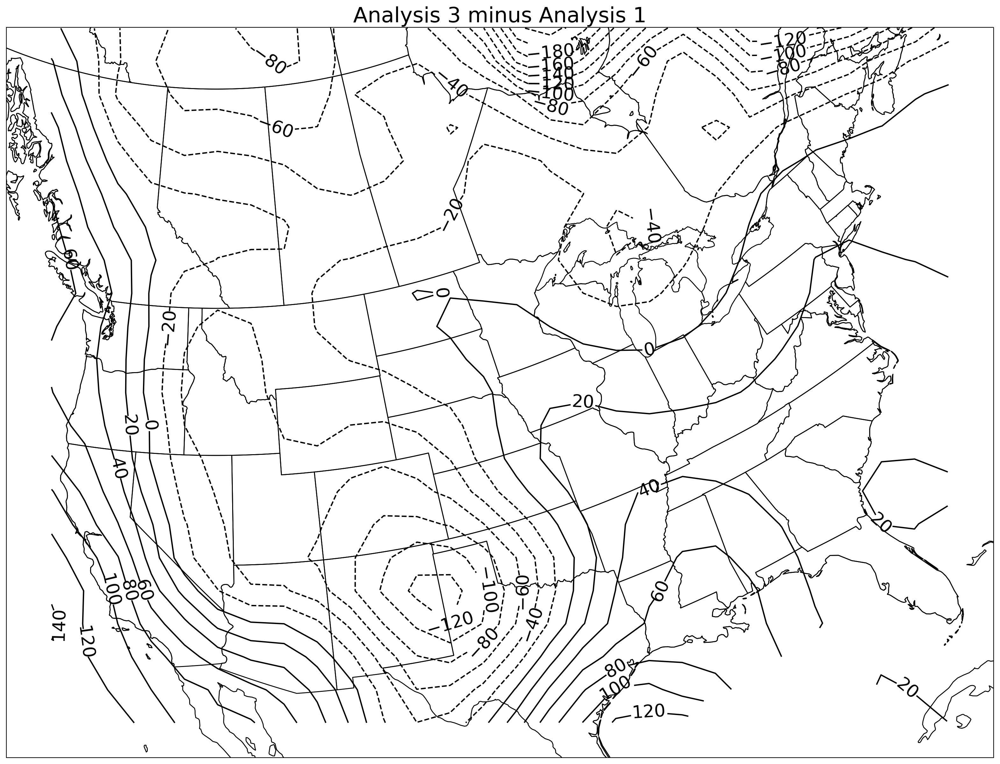

In [136]:
### Plot Analysis Differences ###
fig = plt.figure(figsize = (20,20),dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, diff_31, colors = 'k', levels = np.arange(-300,300,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-300,300,20))
plt.title('Analysis 3 minus Analysis 1')
plt.show()

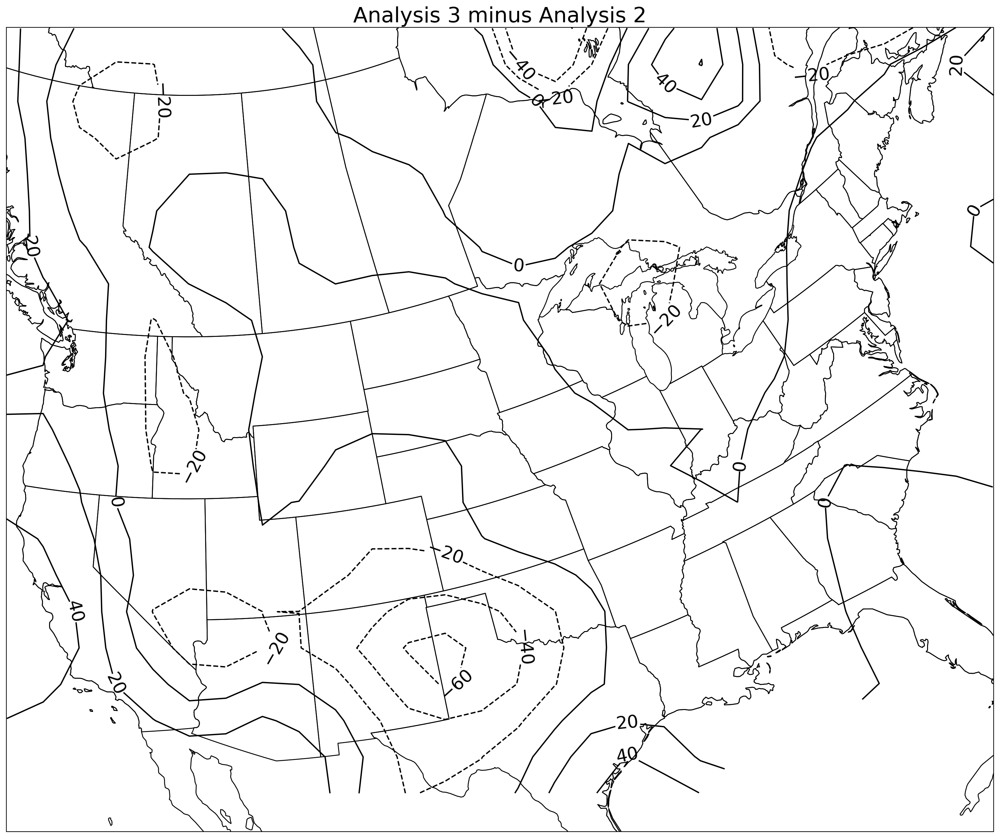

In [137]:
### Plot Analysis Differences ###
fig = plt.figure(figsize = (20,20),dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, diff_32, colors = 'k', levels = np.arange(-300,300,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-300,300,20))
plt.title('Analysis 3 minus Analysis 2')
plt.show()

In [138]:
### Store the analyses in text files ###
with open('HW2_roi_0_Horan.txt', 'a+') as f:
    f.write('grid_point, number_obs_available, analysis_value\n')
    for i in range(len(xs)):
        for j in range(len(xs[0])):
            grid_point = str([i,j])
            n_obs_avail = str(n_obs_arr[i,j,0])
            analysis_val = str(analysis_arr[i,j,0])
            out_str = grid_point + ',' + n_obs_avail + ',' + analysis_val + '\n'
            f.write(out_str)

In [139]:
### Store the difference fields in text files ###
with open('HW2_roi_1_Horan.txt', 'a+') as f:
    f.write('grid_point, number_obs_available, analysis_value\n')
    for i in range(len(xs)):
        for j in range(len(xs[0])):
            grid_point = str([i,j])
            n_obs_avail = str(n_obs_arr[i,j,1])
            analysis_val = str(analysis_arr[i,j,1])
            out_str = grid_point + ',' + n_obs_avail + ',' + analysis_val + '\n'
            f.write(out_str)

In [140]:
### Store RMS values in text file ###
with open('HW2_roi_2_Horan.txt', 'a+') as f:
    f.write('grid_point, number_obs_available, analysis_value\n')
    for i in range(len(xs)):
        for j in range(len(xs[0])):
            grid_point = str([i,j])
            n_obs_avail = str(n_obs_arr[i,j,2])
            analysis_val = str(analysis_arr[i,j,2])
            out_str = grid_point + ',' + n_obs_avail + ',' + analysis_val + '\n'
            f.write(out_str)

In [141]:
with open('HW2_differences_Horan.txt', 'a+') as f:
    f.write('grid_point, diff2-1, diff3-1, diff3-2\n')
    for i in range(len(xs)):
        for j in range(len(xs[0])):
            grid_point = str([i,j])
            diff21 = str(diff_21[i,j])
            diff31 = str(diff_31[i,j])
            diff32 = str(diff_32[i,j])
            out_str = grid_point + ',' + diff21 + ',' + diff31 + ',' + diff32 + '\n'
            f.write(out_str)

In [ ]:
### In a separte text file (or below), answer the following questions ###
'''
1 - Describe the general features that you see in your contoured analyses.
    In the first pass, there is a trough present but not very deep. There is a deeper trough in both passes 2 and 3. In pass 3, there appears to be an upper level low on the 
    upper fringe of our analysis grid.

2 - Describe the differences that you see in your contoured analyses.  
    Does one analysis seem to be smoother than the other?  If so, what would cause this?
    Passes 2 and 3 seem to be smoother in the area of interest but there are differences introduced in the boundary areas.

3 - What happens as you increase the number of successive correction passes?  Is this 
    desirable?  Why or why not?
    We get better looking features as we continue successive corrections, and resolve well the large scale features. However, in the difference fields,
    we see that boundaries are not handled well due to the cressman weighting. Also, we see that the successive corrections resolve better the trough over the CONUS
    

'''